## Position Context (WinCLIP based Attention)

In [1]:
from data_loader import clip_path_loader
import torch
import torch.nn.functional as F
import cv2
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
import warnings
import clip
from fastprogress import progress_bar
from sklearn import metrics
from scipy.ndimage import gaussian_filter1d
import cv2
import textwrap, re
from transformers import logging
from functions.key_func import key_frame_selection
from functions.chatunivi_func import load_lvlm, lvlm_test

warnings.filterwarnings(action='ignore')
logging.set_verbosity_error()

/miniforge/envs/cuda117/lib/python3.10/site-packages/clip/clip.py:6: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import packaging
/miniforge/envs/cuda117/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


[2025-06-23 13:09:19,440] [INFO] [real_accelerator.py:110:get_accelerator] Setting ds_accelerator to cuda (auto detect)


In [2]:
def print_long_string(long_string, width=70):
    wrapped_string = textwrap.fill(long_string, width)
    print(wrapped_string)

def extract_numbers(file_name):
    numbers = re.findall(r'(\d+)', file_name)
    return tuple(map(int, numbers))

def transform2pil(image, transform=True):
    if transform:
        image = image * 255
        image = np.transpose(image, [1, 2, 0])
        image = (image).astype(np.uint8)
    image_pil = Image.fromarray(image)
    return image_pil

def show_pil_image(pil_image):
    pil_image = pil_image.resize((856, 480))
    plt.figure(figsize=(6, 6))
    plt.imshow(pil_image)
    plt.axis('off')
    plt.show()

In [3]:
def extract_score(text):
    match = re.search(r'(\d+(\.\d+)?)', text)
    if match:
        return float(match.group(0))
    else:
        return 0.0

def generate_output(text):
    result = {
        "score": extract_score(text),
        "reason": text
    }
    return result

def min_max_normalize(arr, eps=1e-8):
    min_val = np.min(arr)
    max_val = np.max(arr)
    denominator = max_val - min_val + eps  # Avoid division by zero
    normalized_arr = (arr - min_val) / denominator
    return normalized_arr

def show_score_graph(answers_idx, scores, auc, x='Frame', y='Anomaly Score'):
    length = len(scores)
    plt.clf()
    plt.figure(figsize=(10, 5))
    plt.ylim([0.0, 1.0])
    plt.plot([num for num in range(length)],[score for score in scores], label=f'Predicted: AUC={auc:.3f}') # plotting
    plt.bar(answers_idx, max(scores), width=1, color='#BBCBE7',alpha=0.5, label='Ground-truth') # check answer
    plt.xlabel(x, fontsize=14)
    plt.ylabel(y, fontsize=14)
    plt.legend(fontsize=14)

---

0. Text Embedding

In [4]:
class prompt_order():
    def __init__(self) -> None:
        super().__init__()
        self.template_list = [
            "a cropped photo of the {}.",
            "a close-up photo of a {}.",
            "a close-up photo of the {}.",
            "a bright photo of a {}.",
            "a bright photo of the {}.",
            "a dark photo of the {}.",
            "a dark photo of a {}.",
            "a jpeg corrupted photo of the {}.",
            "a jpeg corrupted photo of the {}.",
            "a blurry photo of the {}.",
            "a blurry photo of a {}.",
            "a photo of a {}.",
            "a photo of the {}.",
            "a photo of a small {}.",
            "a photo of the small {}.",
            "a photo of a large {}.",
            "a photo of the large {}.",
            "a photo of the {} for visual inspection.",
            "a photo of a {} for visual inspection.",
            "a photo of the {} for anomaly detection.",
            "a photo of a {} for anomaly detection."
        ]

    def prompt(self, class_name):
        input_ensemble_template = [template.format(class_name) for template in self.template_list]
        return input_ensemble_template

In [5]:
def make_text_embedding(model, device, text=None, type_list=None, class_adaption=False, template_adaption=False):
    text_generator = prompt_order()

    with torch.no_grad():
        if class_adaption:
            text_feature_arr = []
            for type in type_list:
                if template_adaption:
                    text_list = text_generator.prompt(type)
                    texts = clip.tokenize(text_list).to(device)
                else:
                    text_list = [type for _ in range(1)]
                    texts = clip.tokenize(text_list).to(device)
                text_features = model.encode_text(texts).float()
                avg_text_feature = torch.mean(text_features, dim = 0, keepdim= True)
                text_feature_arr.append(avg_text_feature)
            text_embedding = torch.stack(text_feature_arr).squeeze(1)

        else:
            if template_adaption:
                text_list = text_generator.prompt(text)
                texts = clip.tokenize(text_list).to(device)
            else:
                text_list = [text for _ in range(1)]
                texts = clip.tokenize(text_list).to(device)
            text_features = model.encode_text(texts).float()
            text_embedding = torch.mean(text_features, dim = 0, keepdim= True)
    return text_embedding

1. Patch Partition

In [6]:
def split_one_image_with_unfold(image_path, kernel_size=(80, 80), stride_size=None):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (240, 240)).astype('float32')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype('float32')
    image = (image / 255)
    image = torch.tensor(image).permute(2, 0, 1).unsqueeze(0).float()  # (H, W, C) -> (C, H, W) -> (1, C, H, W)

    if stride_size == None:
        stride_size = kernel_size

    org_patches = F.unfold(image, kernel_size=(kernel_size[0], kernel_size[1]), stride=(stride_size[0], stride_size[1]))
    patches = org_patches.permute(0, 2, 1).reshape(-1, 3, kernel_size[0], kernel_size[1])
    patches = F.interpolate(patches, size=(224, 224), mode='bilinear')
    return patches

2. Patch Similarity Calculation

In [7]:
def patch_similarity(patches, text_embedding, model, device, class_adaption=False, type_id=None):
    with torch.no_grad():
        patches = patches.to(device)
        image_embedding = model.encode_image(patches).float()
        image_embedding /= image_embedding.norm(dim=-1, keepdim=True)
        text_embedding /= text_embedding.norm(dim=-1, keepdim=True)
        similarity = (text_embedding @ image_embedding.T).cpu() # (1, patch_length) or (class_length, patch_length)

    if class_adaption:
        similarity = similarity.softmax(dim=0)
        return similarity[type_id]
    else:
        return similarity

3. Attention

In [8]:
def normalize(pred, max_value=None, min_value=None):
    if max_value is None or min_value is None:
        return (pred - pred.min()) / (pred.max() - pred.min())
    else:
        return (pred - min_value) / (max_value - min_value)

In [9]:
def attention(img_path, sim):
    img = cv2.cvtColor(cv2.resize(cv2.imread(img_path), (224, 224)), cv2.COLOR_BGR2RGB)
    mask = normalize(sim)
    mask = np.repeat(mask[:,:,np.newaxis], 3, axis=2)
    attn = (img * mask).astype(np.uint8)
    return attn

In [10]:
def winclip_attention(img_path, text_embedding, clip_model, device, class_adaption=False, type_id=None):
    patches_img = split_one_image_with_unfold(img_path, kernel_size=(240, 240)) # 1x1
    patches_lge = split_one_image_with_unfold(img_path, kernel_size=(80, 80)) # 3x3
    patches_mid = split_one_image_with_unfold(img_path, kernel_size=(48, 48)) # 5x5

    sim_img = patch_similarity(patches_img, text_embedding, clip_model, device, class_adaption, type_id).view(1, 1, 1, 1)
    sim_lge = patch_similarity(patches_lge, text_embedding, clip_model, device, class_adaption, type_id).view(1, 1, 3, 3)
    sim_mid = patch_similarity(patches_mid, text_embedding, clip_model, device, class_adaption, type_id).view(1, 1, 5, 5)

    usim_img = F.interpolate(sim_img, size=(224, 224), mode='bilinear').squeeze(0)
    usim_lge = F.interpolate(sim_lge, size=(224, 224), mode='bilinear').squeeze(0)
    usim_mid = F.interpolate(sim_mid, size=(224, 224), mode='bilinear').squeeze(0)
    usim_total = ((usim_img + usim_lge + usim_mid) / 3).squeeze(0).numpy()

    attentioned = attention(img_path, usim_total)
    output_image = transform2pil(attentioned, False)
    return output_image

----

## Load Model

In [11]:
device = "cuda" if torch.cuda.is_available() else "cpu"
clip_model, clip_preprocess = clip.load('ViT-B/32', device=device)

100%|███████████████████████████████████████| 338M/338M [00:04<00:00, 78.0MiB/s]


In [12]:
# Model Parameter
model_path = "Chat-UniVi/weights/Chat-UniVi"  # or "Chat-UniVi/Chat-UniVi-13B"
tokenizer, lvlm_model, image_processor = load_lvlm(model_path)

Loading checkpoint shards: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:58<00:00, 29.40s/it]


### Compare (Anomaly Detection)

---

0. Setting

In [43]:
video_name = '01'
keyword = 'yellow sticker'
clip_length = 1

In [44]:
data_root = '/mnt/task_runtime/Paper-AnyAnomaly'
test_data_path = os.path.join(data_root, 'gif_bc-1-1_pad')
video_folder_path = os.path.join(test_data_path, 'frames', video_name)
# video_label_path =  os.path.join(test_data_path, 'frames', f'{video_name}.npy')

video_folder_name = video_folder_path.split('/')[-1]
video = clip_path_loader(video_folder_path, clip_length)

print(keyword)
print(len(video))

yellow sticker
242


In [45]:
type_list = ["car", "bicycle", "fighting", "throwing", "hand_truck", "running", "skateboarding", "falling", "jumping", "loitering", "motorcycle", "yellow sticker"]
type_ids = {}
for i, type in enumerate(type_list):
    type_ids[str(type)] = i
type_id = type_ids[keyword]
print(type_id)

11


In [46]:
template_adaption = True
class_adaption = True
text_embedding = make_text_embedding(clip_model, device, text=keyword, type_list=type_list,
                                     class_adaption=class_adaption, template_adaption=template_adaption)
print(text_embedding.shape)

torch.Size([12, 512])


In [47]:
def make_instruction(keyword):
    instruction = (
        f"- **Task**: Evaluate whether the given image includes **{keyword}** on a scale from 0 to 1. "
        f"A score of 1 means **{keyword}** is clearly present in the image, while a score of 0 means **{keyword}** is not present at all. "
        f"For intermediate cases, assign a value between 0 and 1 based on the degree to which **{keyword}** is visible.\n"
        f"- **Consideration**: The key is whether **{keyword}** is present in the image, not its focus. Thus, if **{keyword}** is present, even if it is not the main focus, assign a higher score like 1.0.\n"
        f"- **Response**: Provide the score as a float, rounded to one decimal place, including a brief reason for the score in **one short sentence**."
    )
    return instruction

---

1. Original frame --> Anomaly Detection

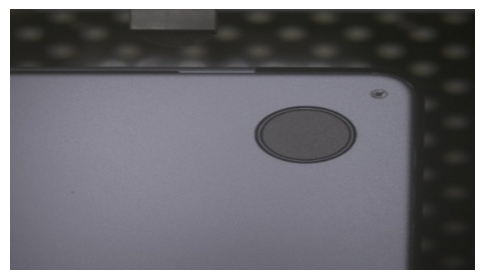

0 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


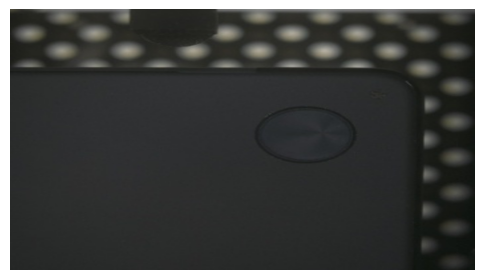

1 The image does not show a yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


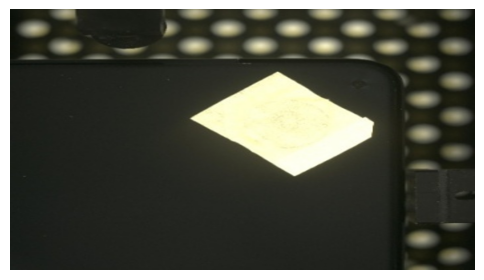

2 The yellow sticker is barely visible and partially covered by a black object, so I would give it a score of 0.5.


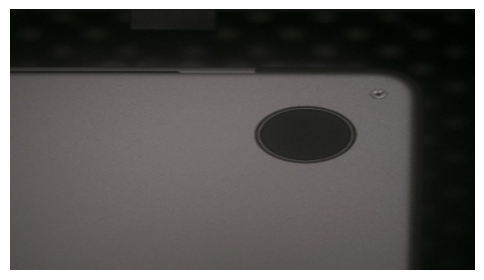

3 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not the main focus of the image, and it is not present in the scene.


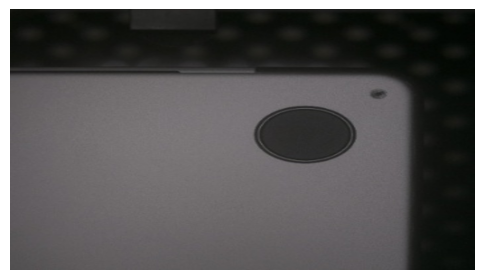

4 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a small part of the picture.


KeyboardInterrupt: 

In [49]:
predicted1 = []
insturuction = make_instruction(keyword)

for i, cp in enumerate(progress_bar(video, total=len(video))):
    # key frame selection
    key_path = key_frame_selection(cp, keyword, clip_model, clip_preprocess, device)

    # Anomaly Detection
    ad_response = lvlm_test(tokenizer, lvlm_model, image_processor, insturuction, key_path, None)
    score = generate_output(ad_response)['score']

    # visualization
    image = Image.open(key_path)
    show_pil_image(image)
    print(i, ad_response)

    # save anomaly score
    for _ in range(clip_length):
        predicted1.append(score)

2. Position Context --> Anomaly Detection

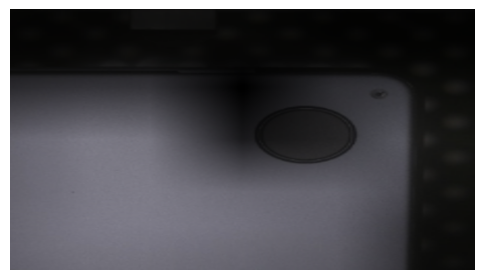

0 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


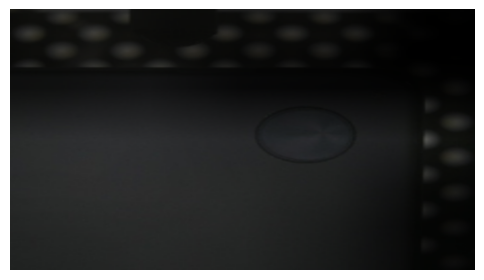

1 The image does not show a yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


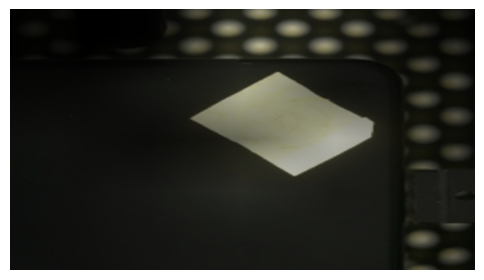

2 The yellow sticker is barely visible and partially covered by the camera, so I would give it a score of 0.5.


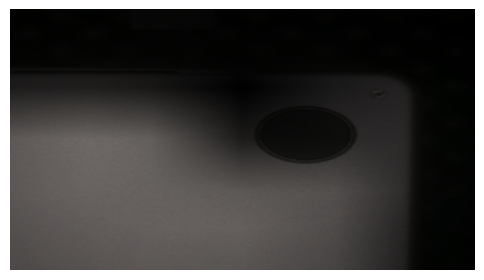

3 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or partially visible sticker.


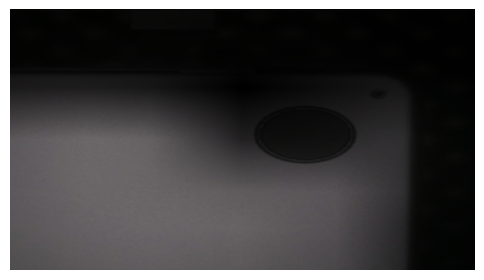

4 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


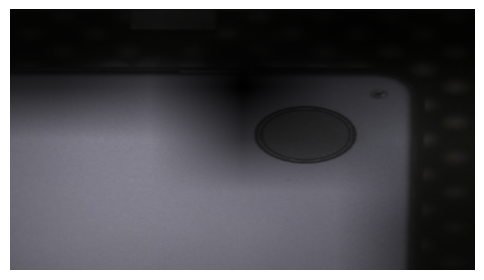

5 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


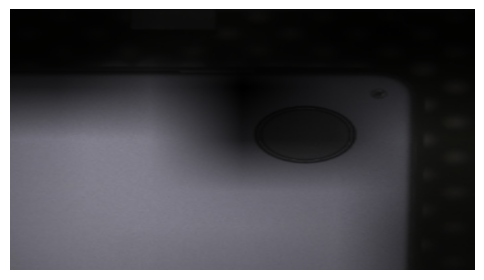

6 The image does not show any yellow sticker. Score: 0.0. The image only displays a black and white view of a cell phone, with no visible stickers.


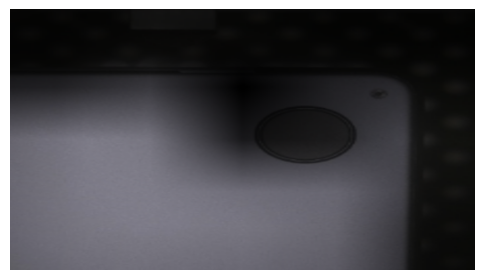

7 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


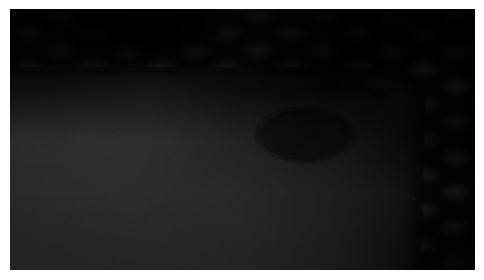

8 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not the main focus of the image, and it is not present in the scene.


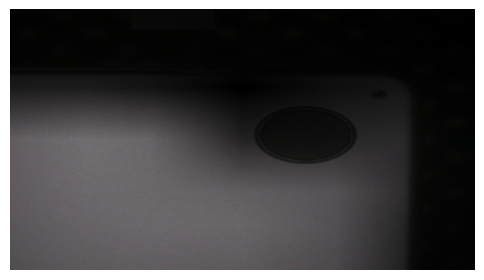

9 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


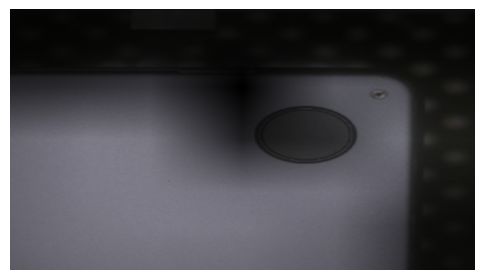

10 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


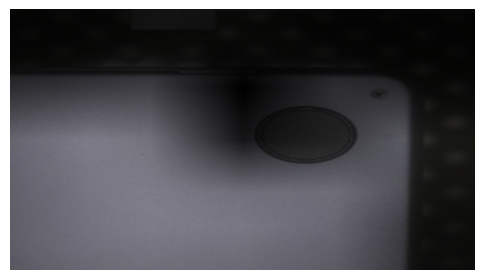

11 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


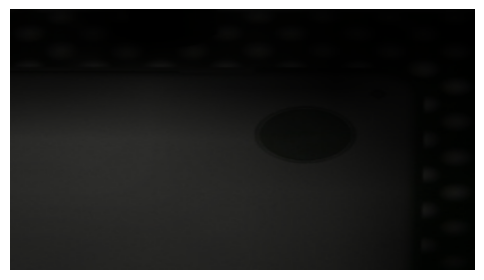

12 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


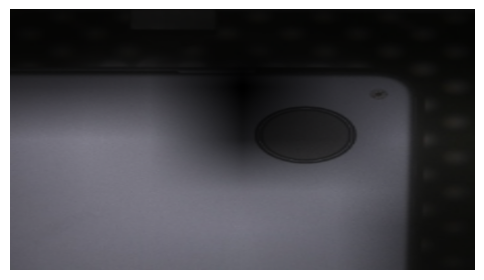

13 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


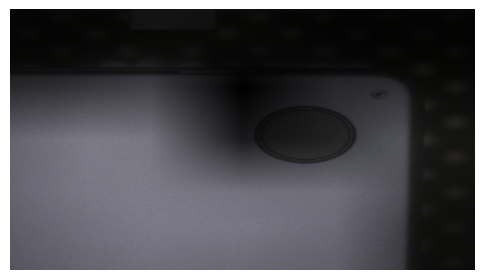

14 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


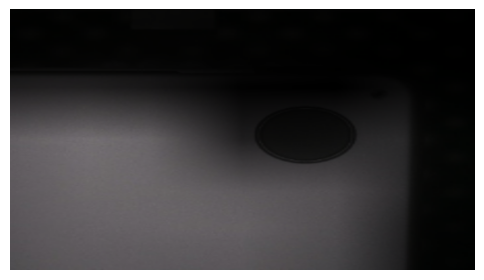

15 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


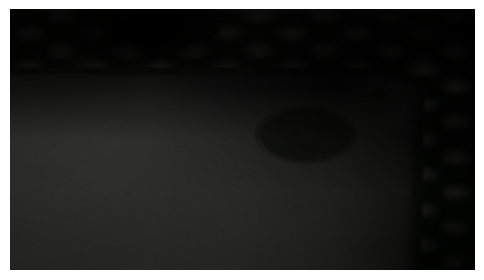

16 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not the main focus of the image, and it is not present in the scene.


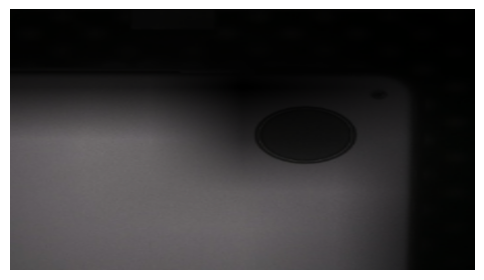

17 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or partially visible sticker.


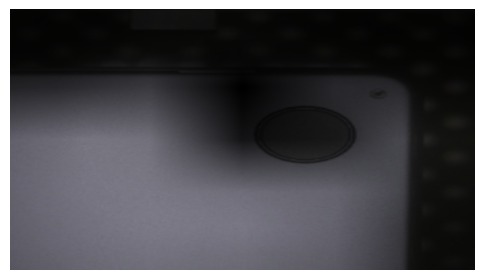

18 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


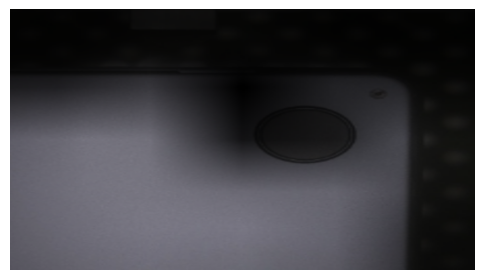

19 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


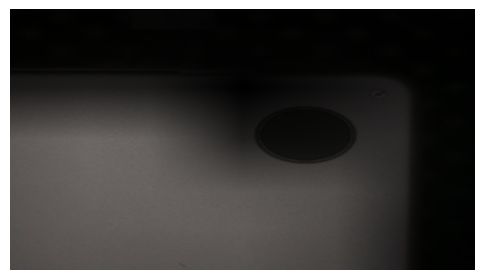

20 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


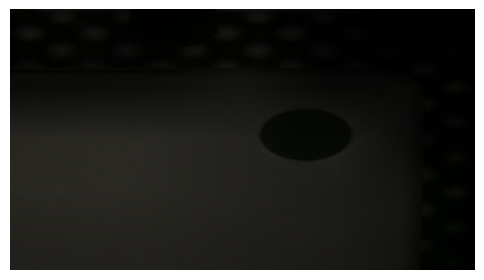

21 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


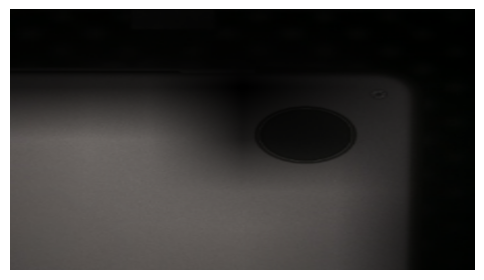

22 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


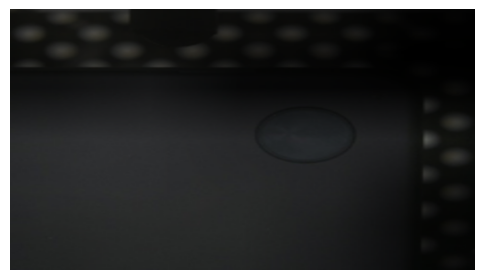

23 The image does not show a yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


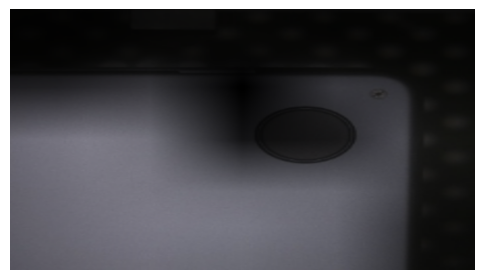

24 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


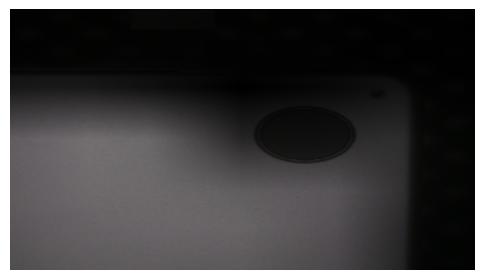

25 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


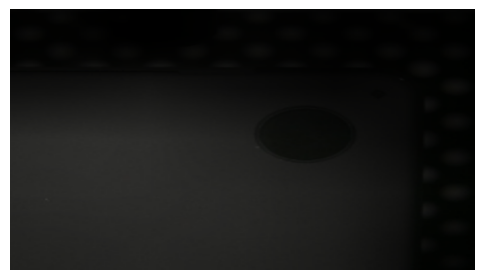

26 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


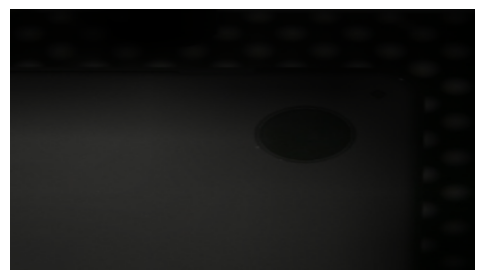

27 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and it is not the main focus, so it doesn't warrant a higher score.


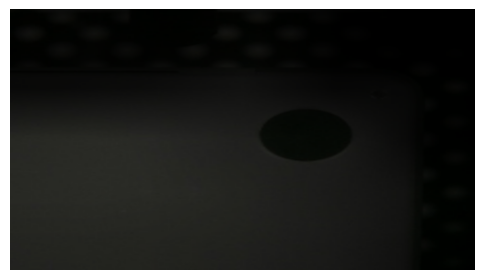

28 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


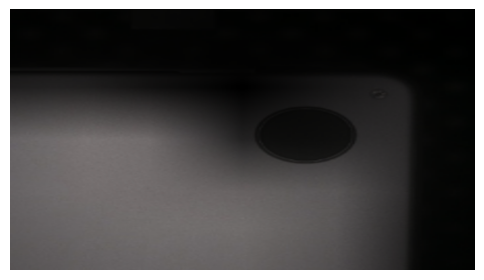

29 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or partially visible sticker.


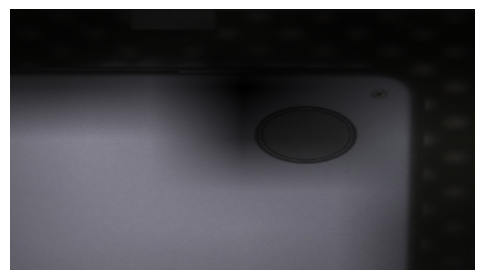

30 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


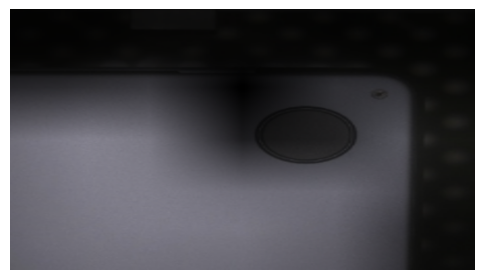

31 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


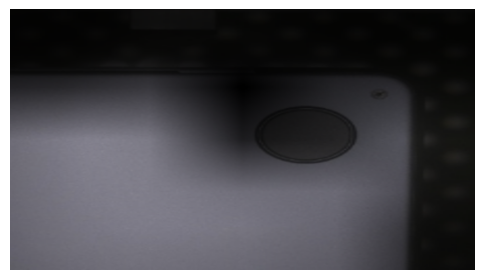

32 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


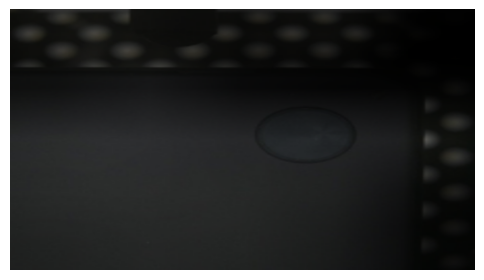

33 The image does not show a yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


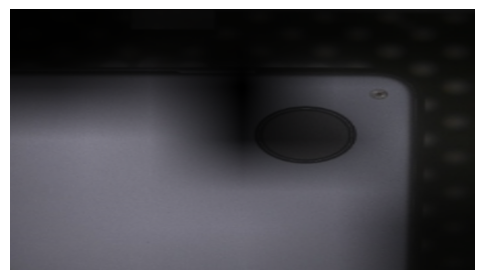

34 The image does not show any yellow sticker. Score: 0.0. The image does not provide clear evidence of a yellow sticker being present.


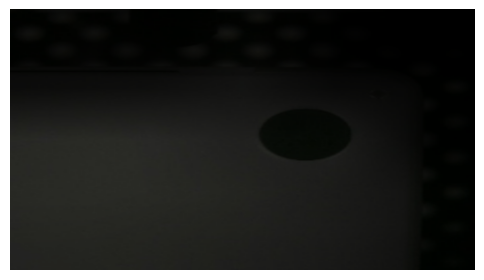

35 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


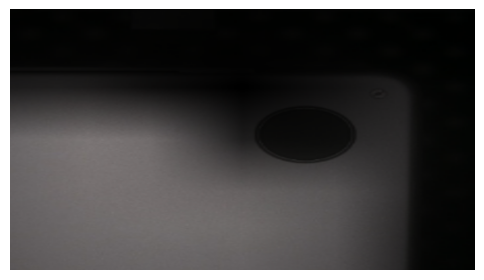

36 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


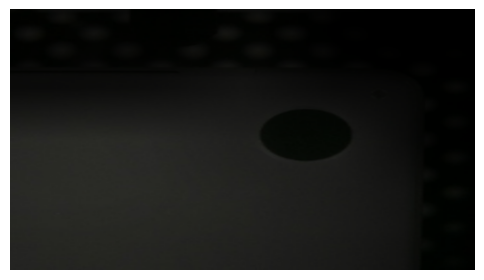

37 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


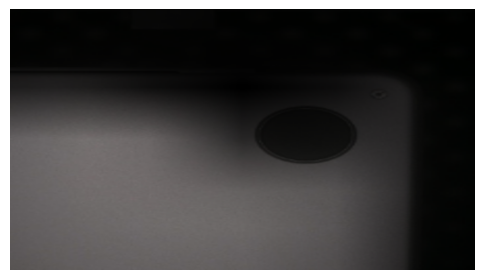

38 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


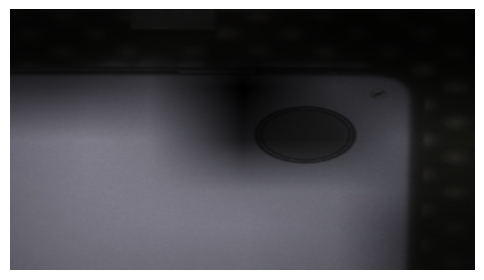

39 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


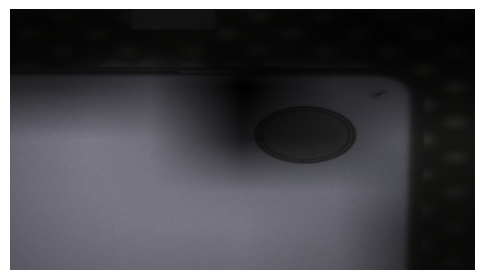

40 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


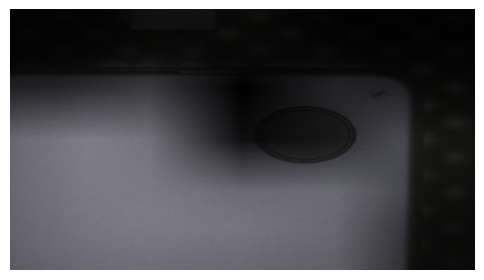

41 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


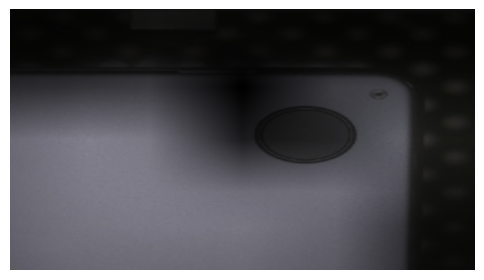

42 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


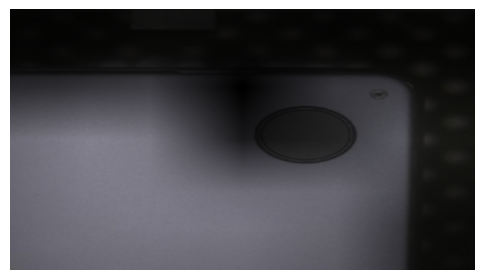

43 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


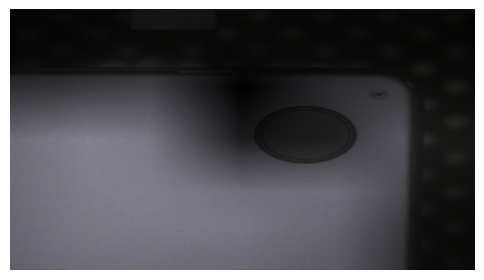

44 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


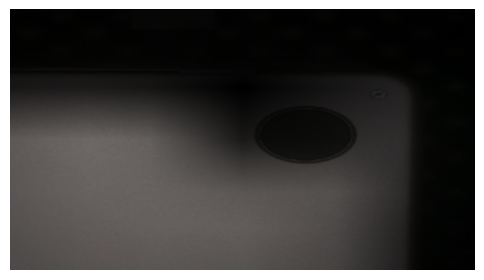

45 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not the main focus of the image, and it is not present in the scene.


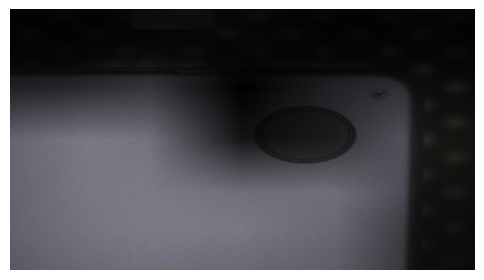

46 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


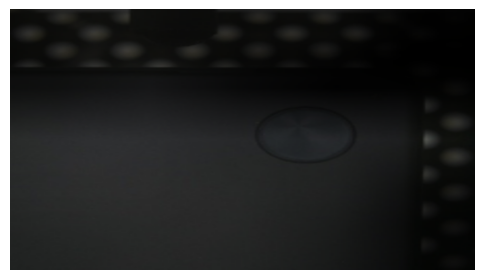

47 The image does not show a yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


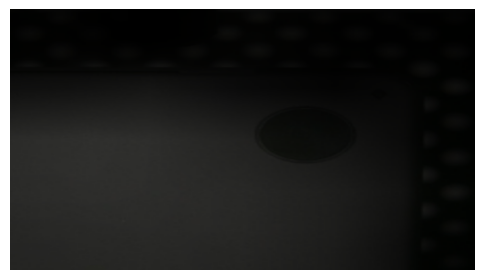

48 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or partially visible sticker.


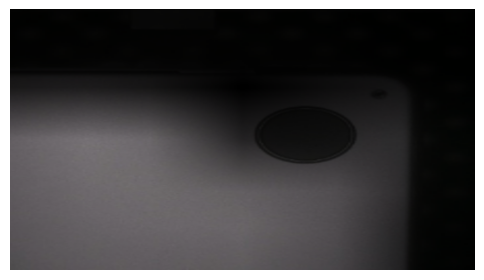

49 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


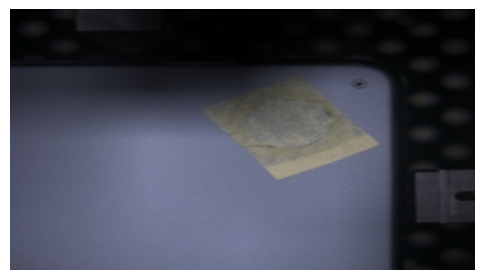

50 The image does not show a yellow sticker on the silver laptop. The score is 0.5 as there is a sticker present, but it is not yellow and it is not on the laptop.


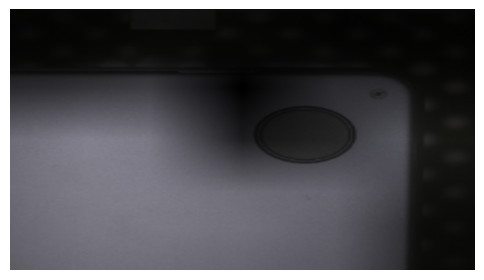

51 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


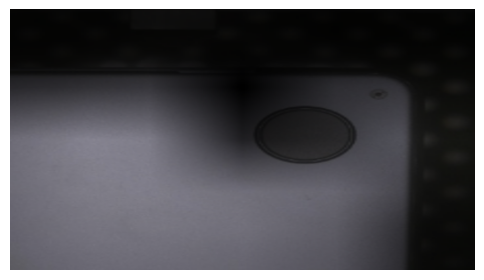

52 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


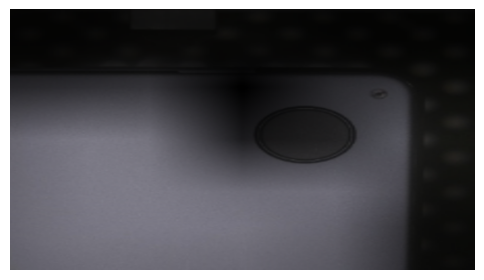

53 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


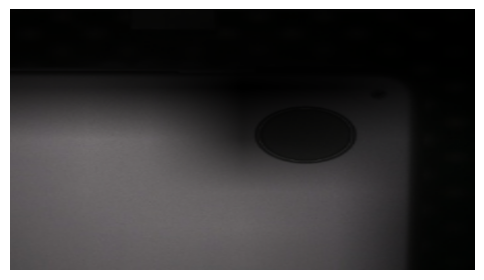

54 The image does not show a yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


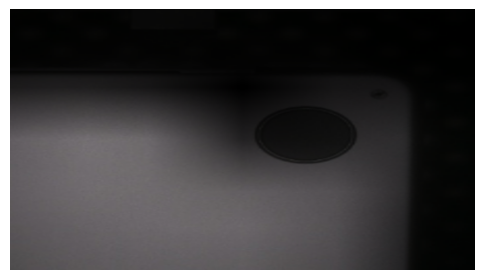

55 The image does not show a yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


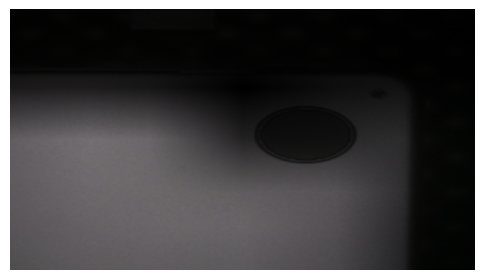

56 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or partially visible sticker.


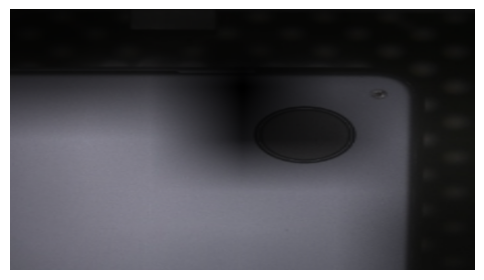

57 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


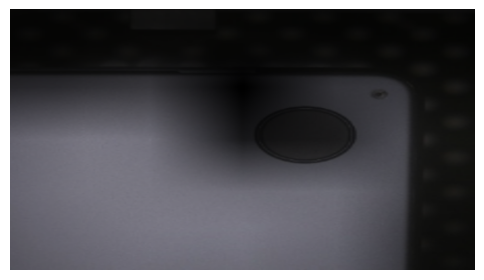

58 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


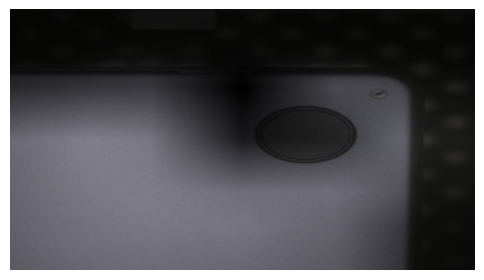

59 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


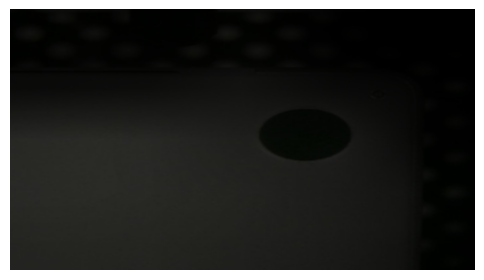

60 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


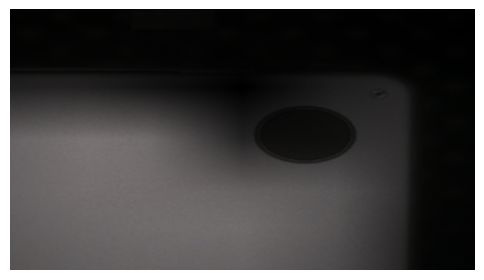

61 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or partially visible sticker.


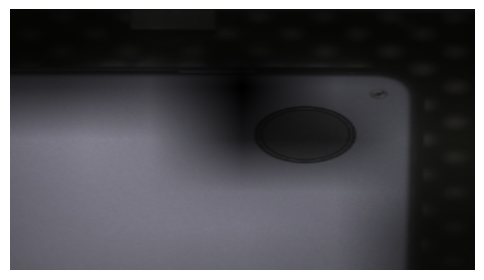

62 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


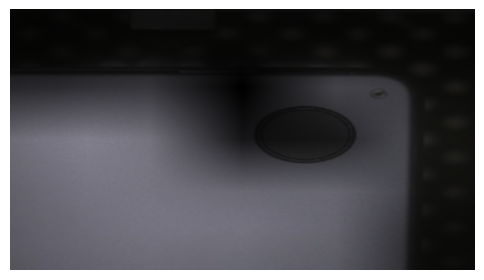

63 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


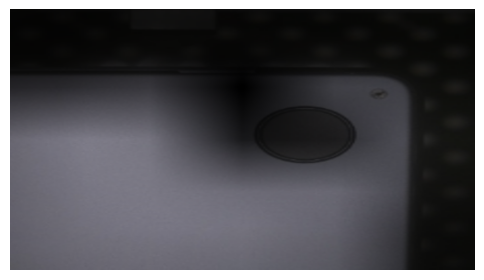

64 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


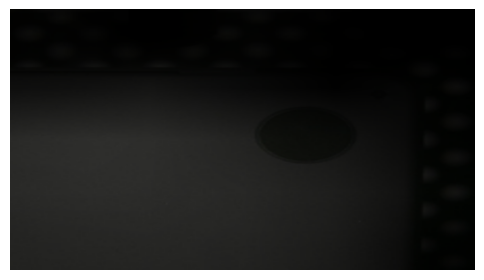

65 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or partially visible sticker.


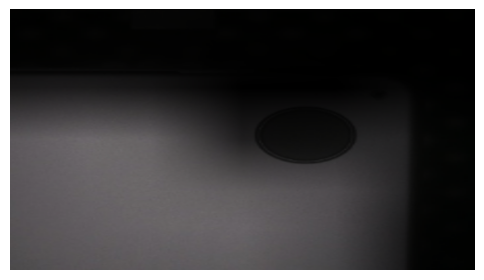

66 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


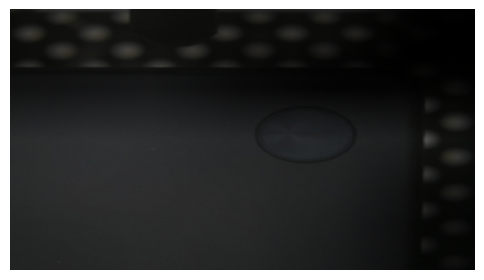

67 The image does not show a yellow sticker, so the score is 0.0. The reason is that there is no visible yellow sticker in the image, making it difficult to assign a higher score.


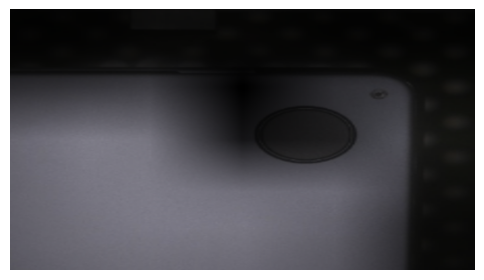

68 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


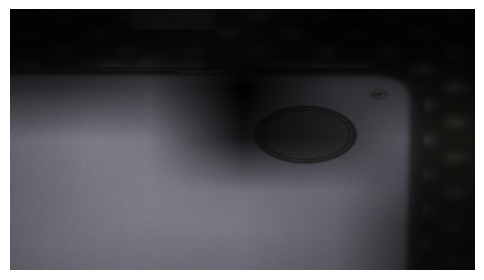

69 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


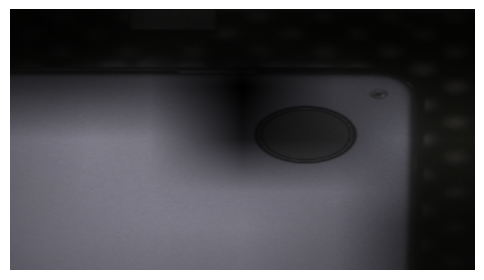

70 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


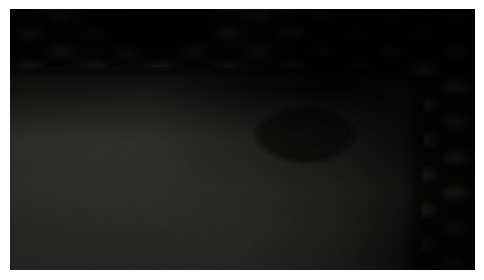

71 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and it is not the main focus, so it doesn't warrant a higher score.


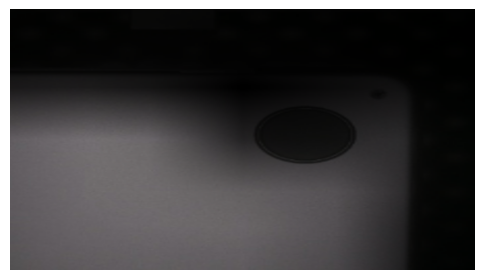

72 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


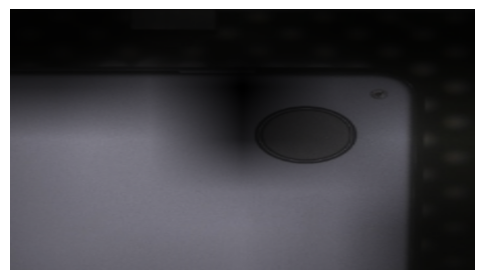

73 The image does not show any yellow sticker. Score: 0.5. The image does not provide a clear view of the sticker, and it is not the main focus of the image.


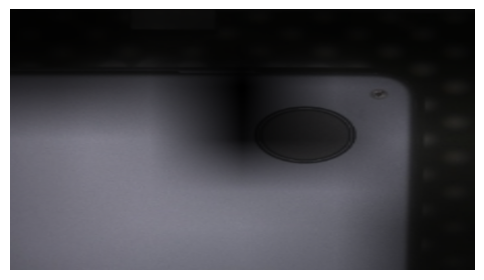

74 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or partially visible sticker.


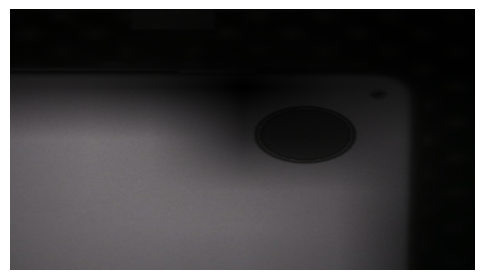

75 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


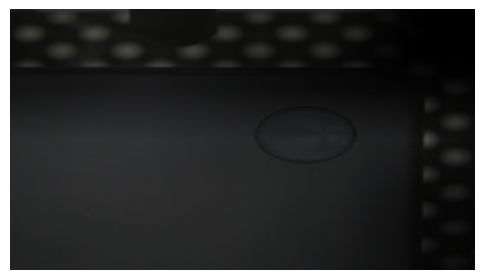

76 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


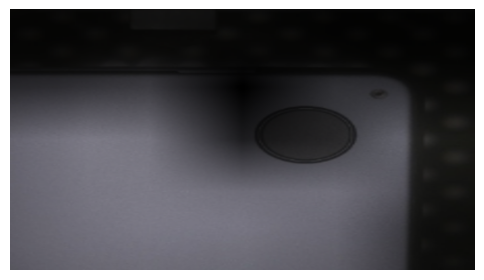

77 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


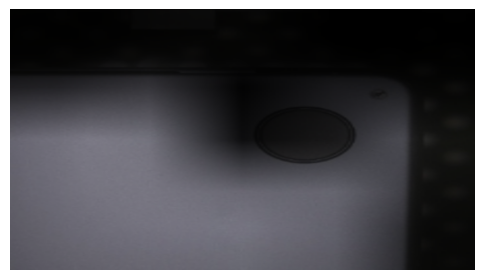

78 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


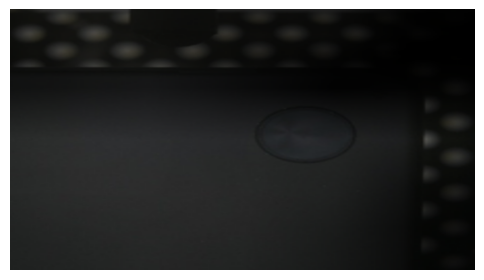

79 The image does not show a yellow sticker, so the score is 0.0. The reason is that there is no visible yellow sticker in the image, and it is not present in the focus.


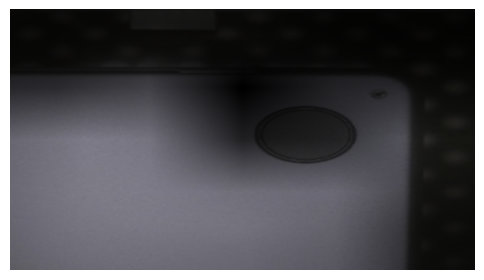

80 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


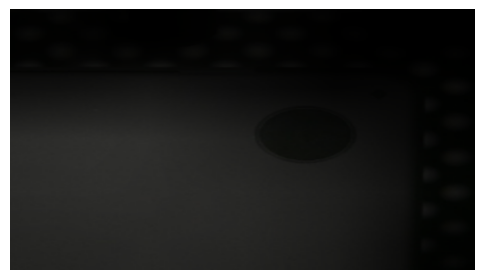

81 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not the main focus of the image, and it is not present in the scene.


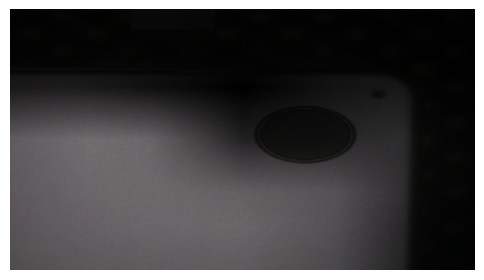

82 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or partially visible sticker.


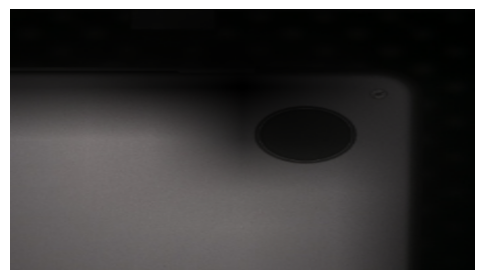

83 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


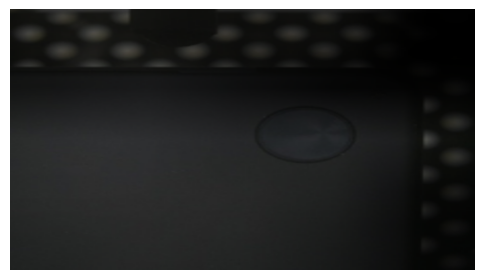

84 The image does not show a yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no clear indication of its presence.


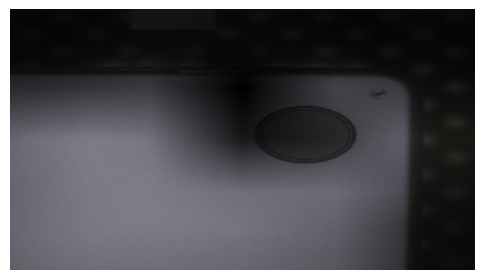

85 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


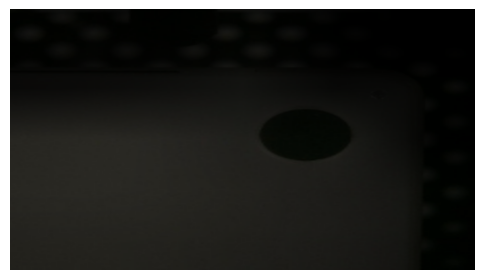

86 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


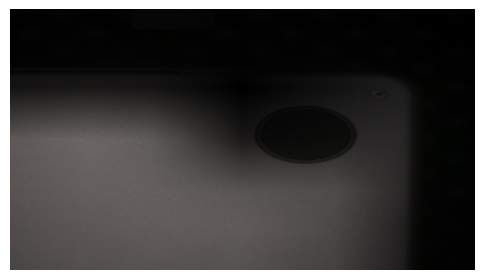

87 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


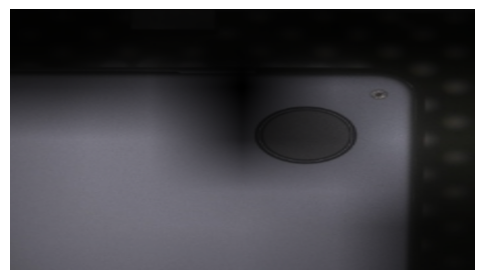

88 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


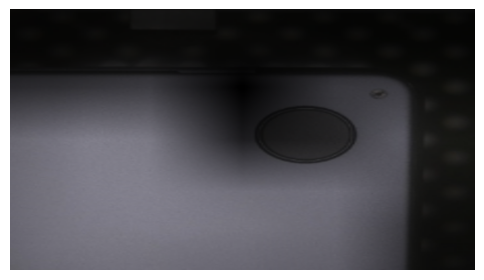

89 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


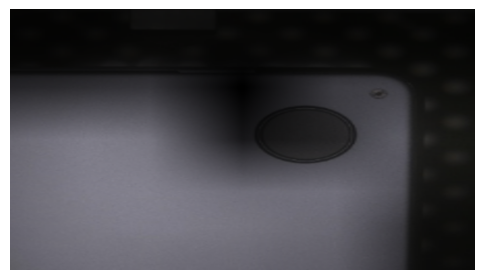

90 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


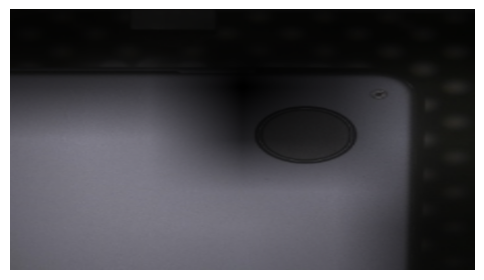

91 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


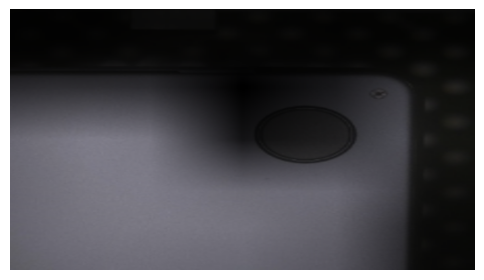

92 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


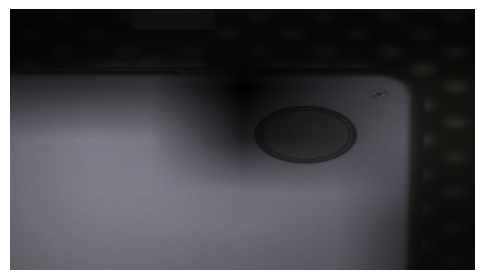

93 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


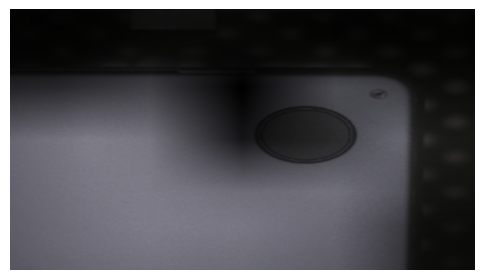

94 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


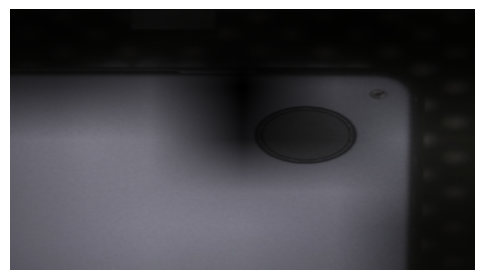

95 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


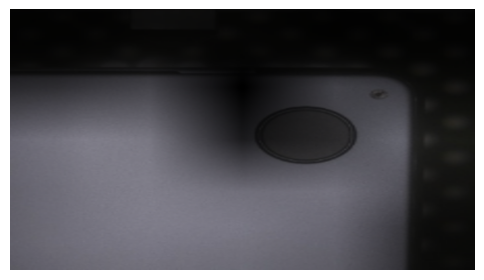

96 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


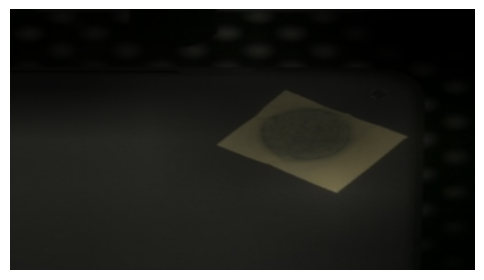

97 The yellow sticker is barely visible and partially covered by the laptop, so I would give it a score of 0.5.


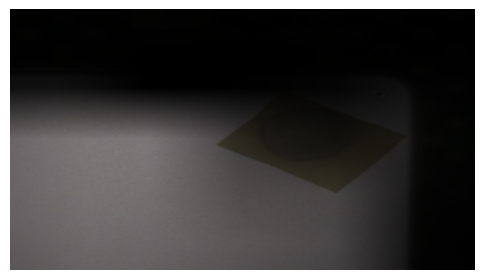

98 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


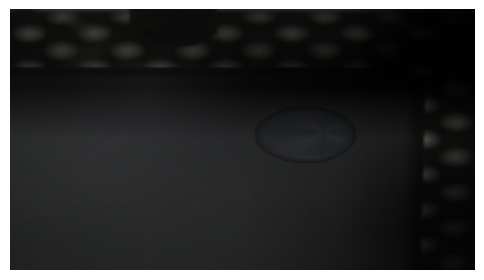

99 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


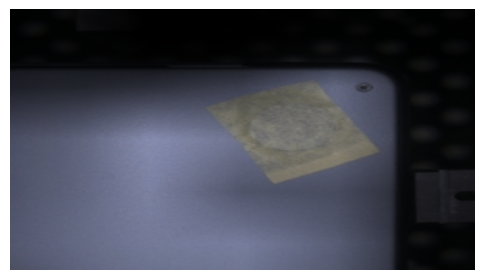

100 The image does not show a yellow sticker on the silver laptop. The score is 0.5 as there is a sticker present, but it is not yellow and not on the laptop.


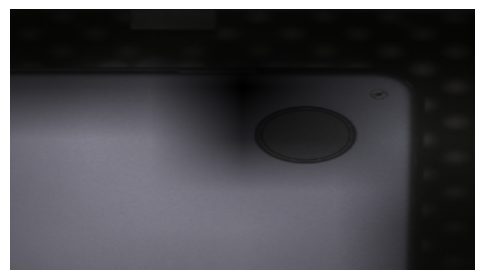

101 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


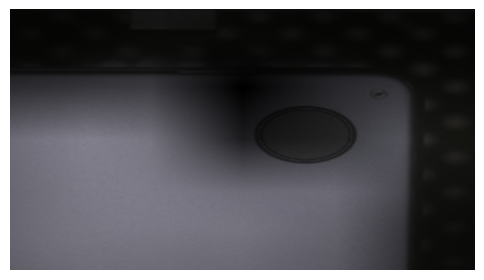

102 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


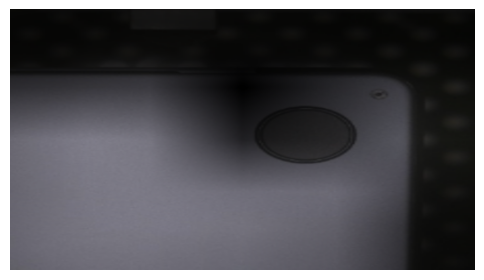

103 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


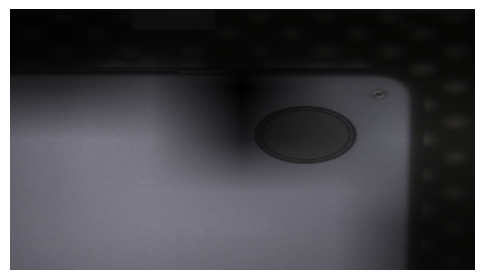

104 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


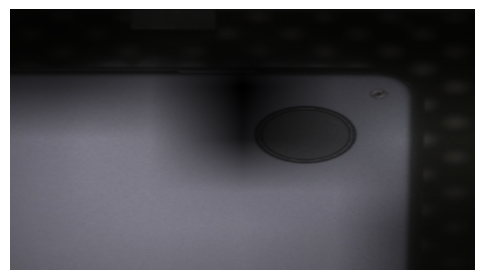

105 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or partially visible sticker.


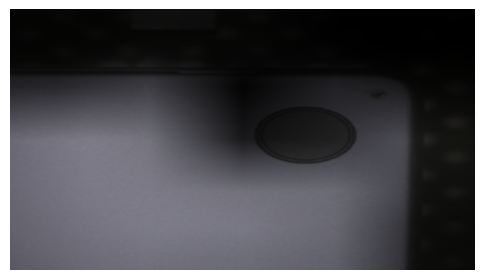

106 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


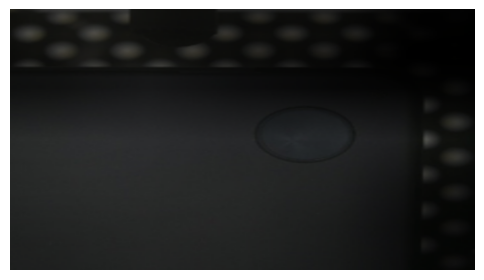

107 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or partially visible sticker.


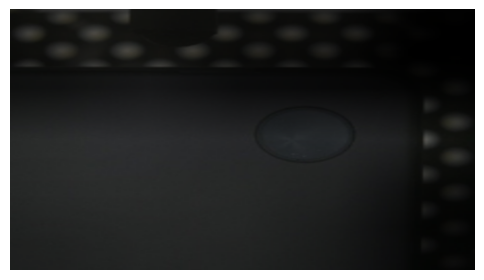

108 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


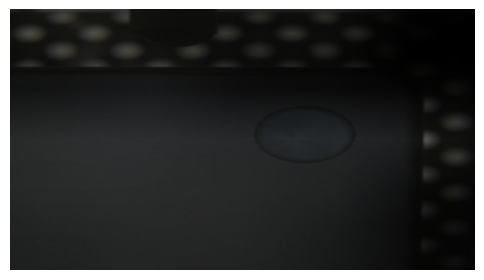

109 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


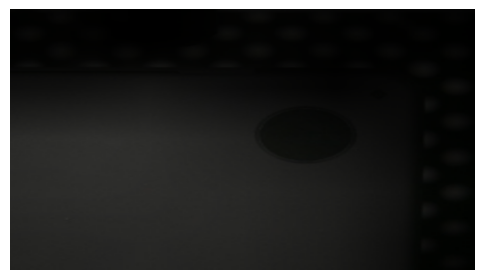

110 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not the main focus of the image, and it is not present in the scene.


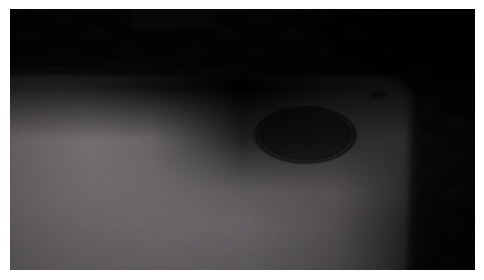

111 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or partially visible sticker.


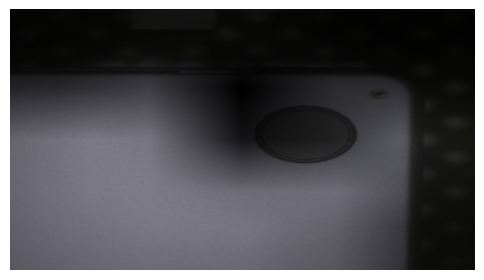

112 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


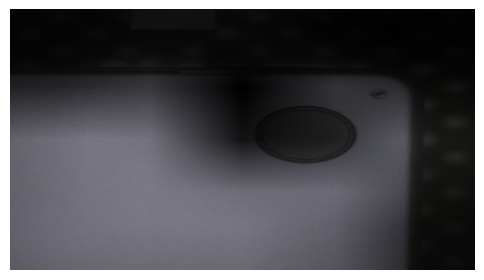

113 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


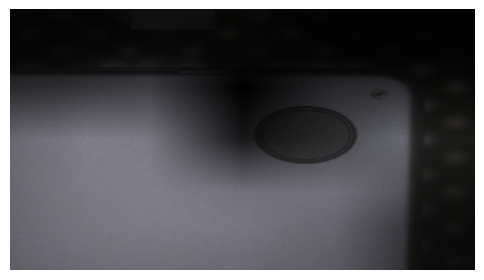

114 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or partially visible sticker.


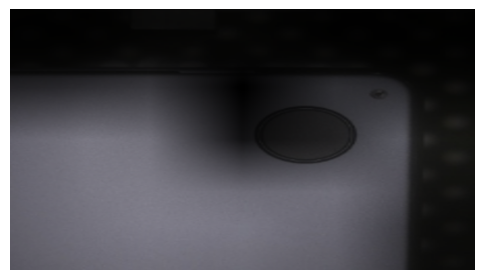

115 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


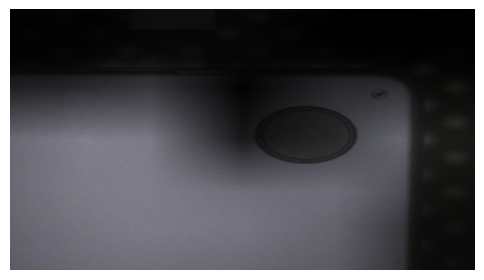

116 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


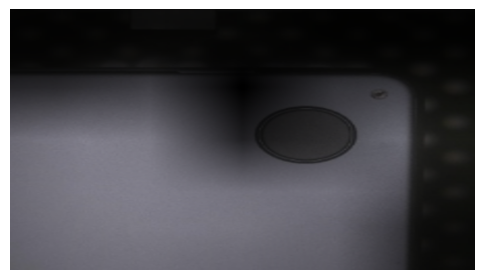

117 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


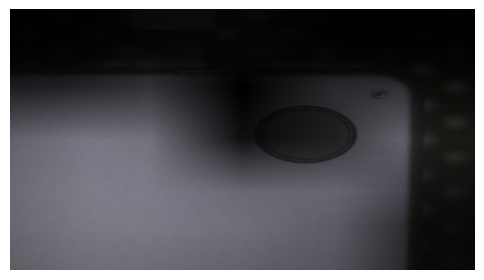

118 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a small part of the picture.


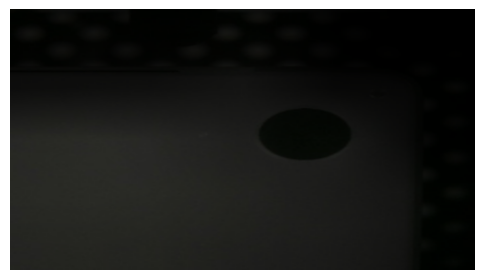

119 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


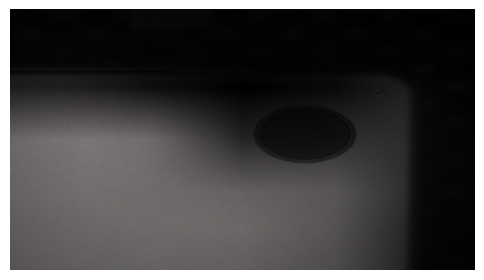

120 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or partially visible sticker.


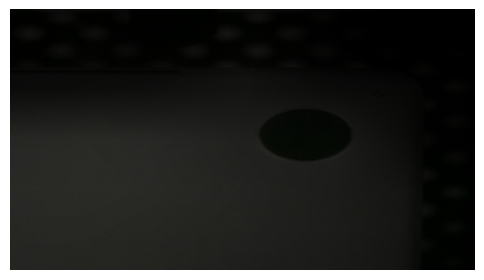

121 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


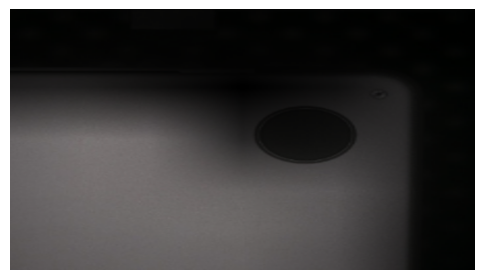

122 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


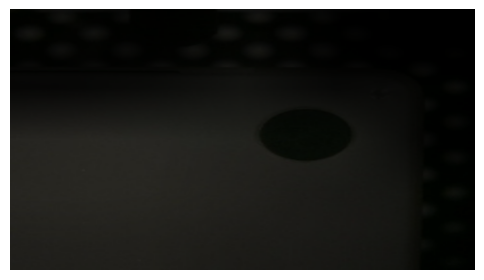

123 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


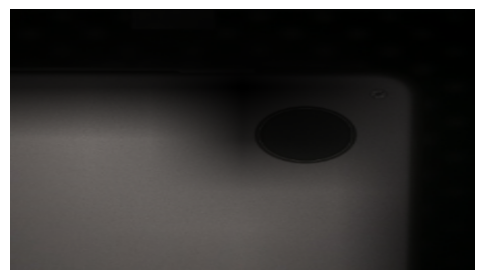

124 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or partially visible sticker.


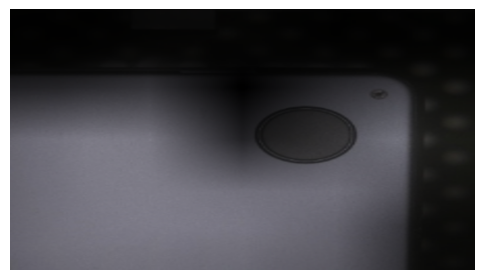

125 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


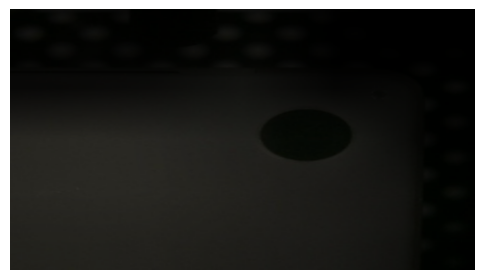

126 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and it is not the main focus, so it doesn't warrant a higher score.


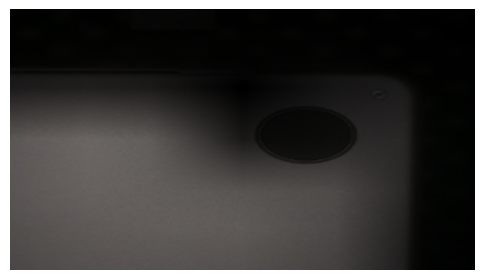

127 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


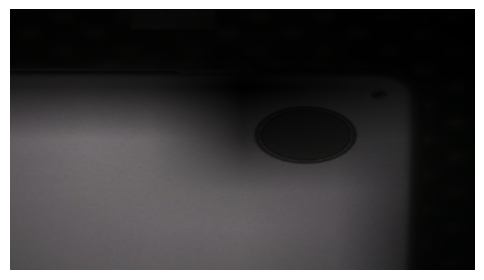

128 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


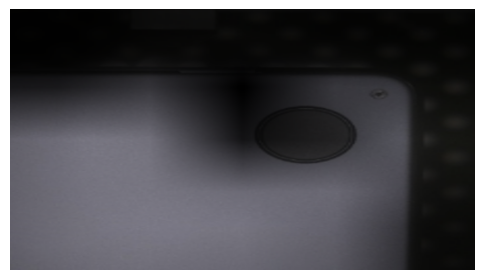

129 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


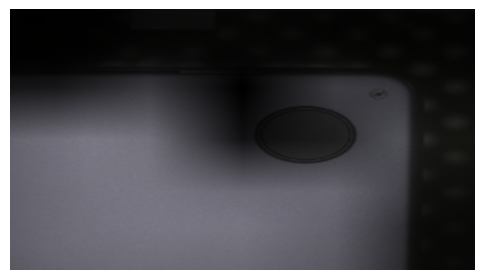

130 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


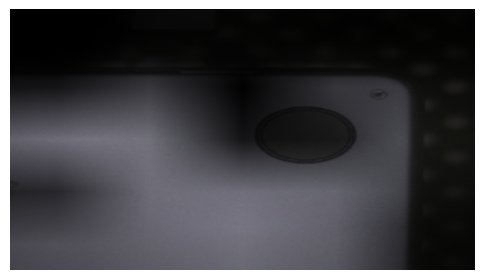

131 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


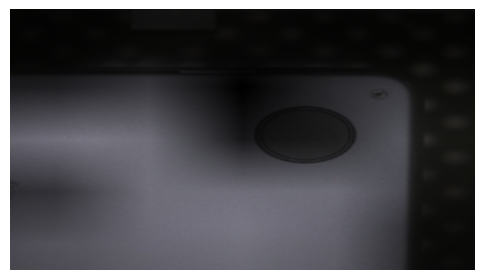

132 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


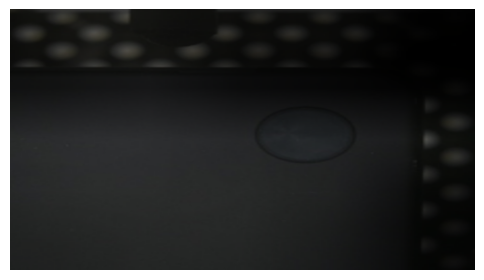

133 The image does not show a yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and it is not the main focus, so it does not warrant a higher score.


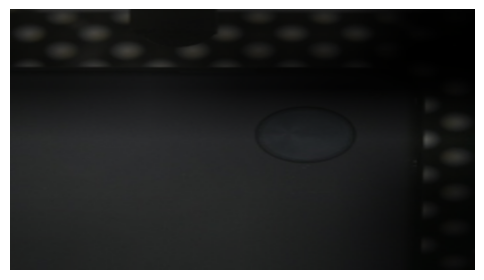

134 The image does not show a yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no clear indication of its presence.


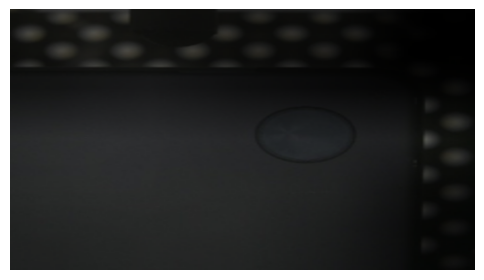

135 The image does not show a yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no clear indication of its presence.


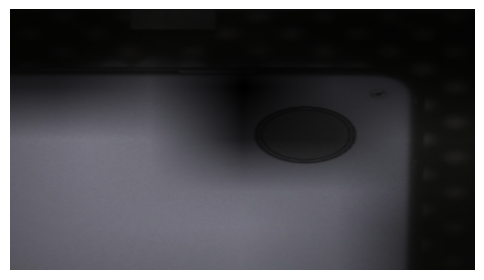

136 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


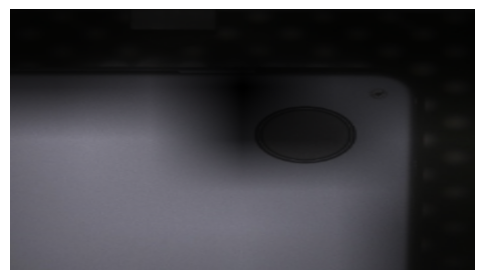

137 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


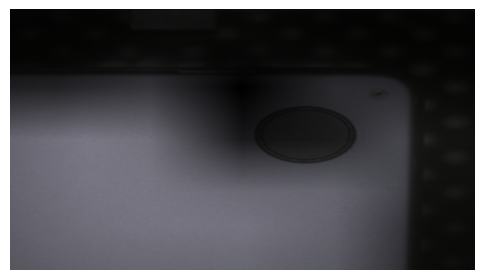

138 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


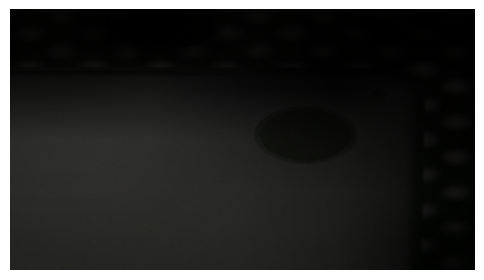

139 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


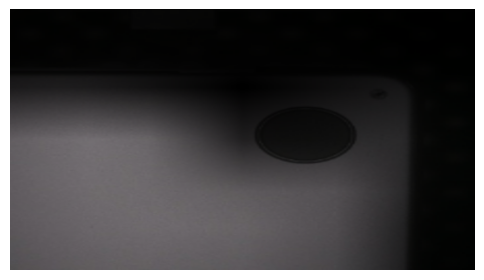

140 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


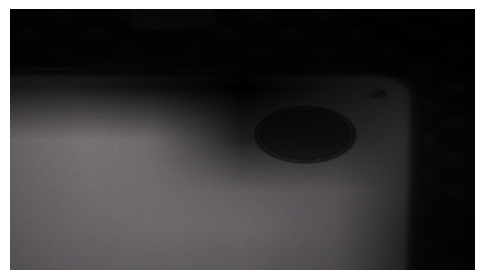

141 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


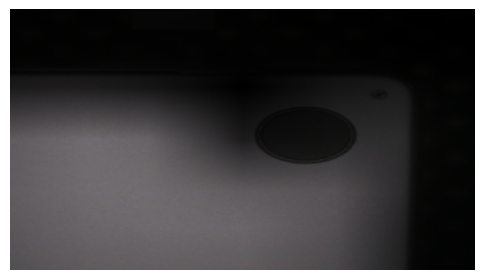

142 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


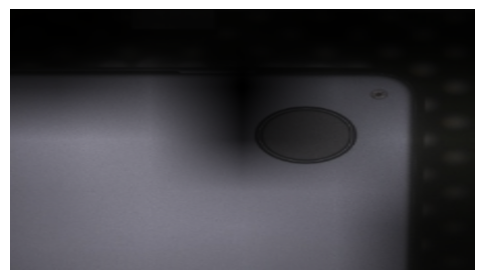

143 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


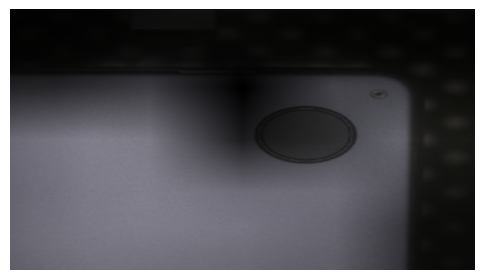

144 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


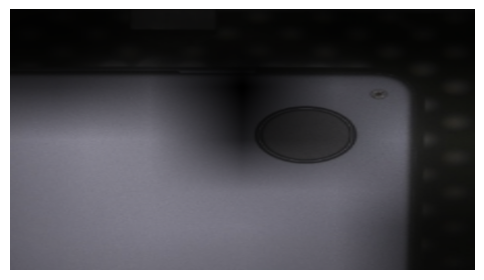

145 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


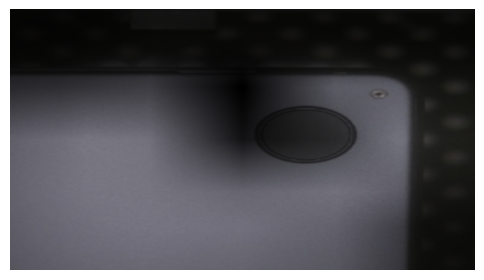

146 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


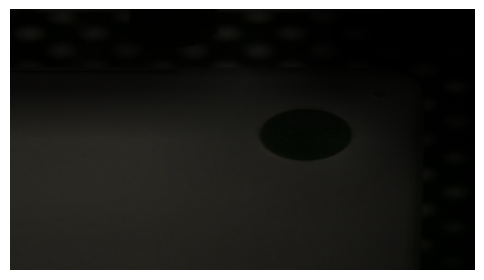

147 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and it is not the main focus, so it doesn't warrant a higher score.


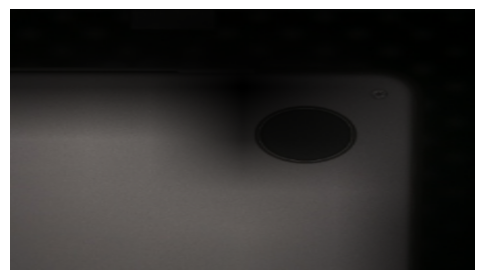

148 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


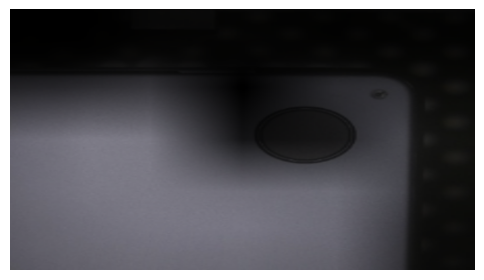

149 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


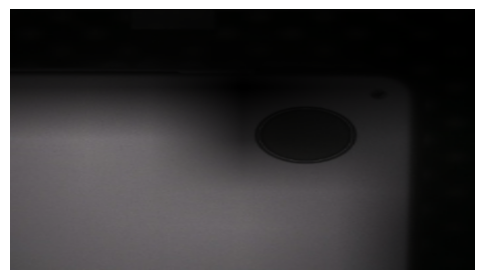

150 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


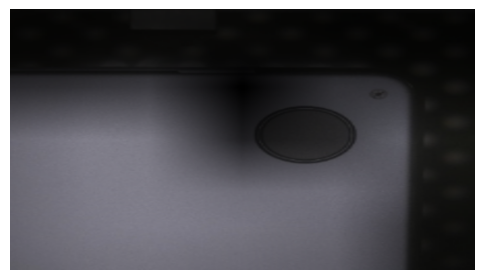

151 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


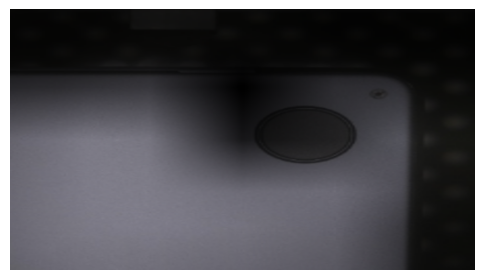

152 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


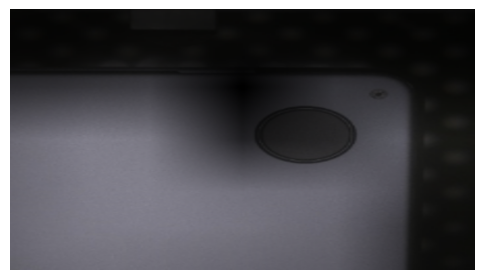

153 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


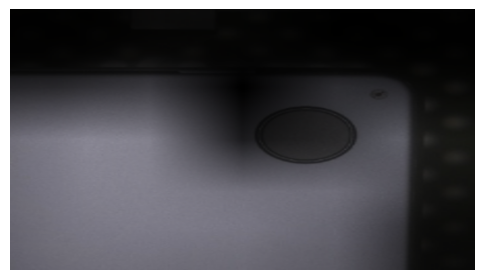

154 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or unclear representation of a yellow sticker.


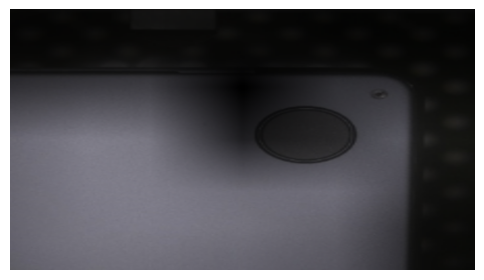

155 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


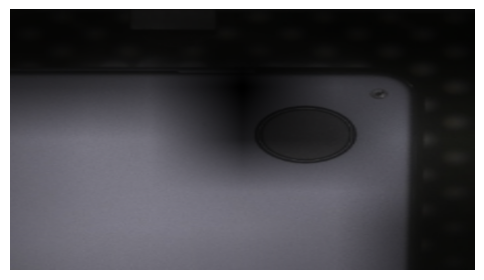

156 The image does not show any yellow sticker, so the score is 0.0. There is no yellow sticker in the image, and it is not even a blurry or partially visible sticker.


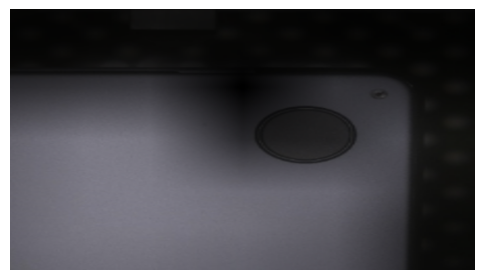

157 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


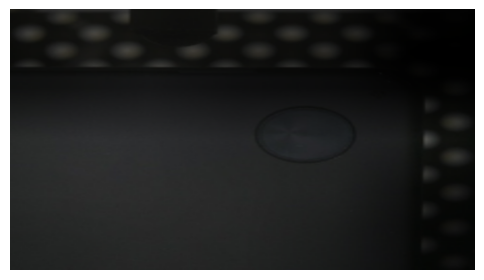

158 The yellow sticker is barely visible and only partially present on the black surface, so I would give it a score of 0.5.


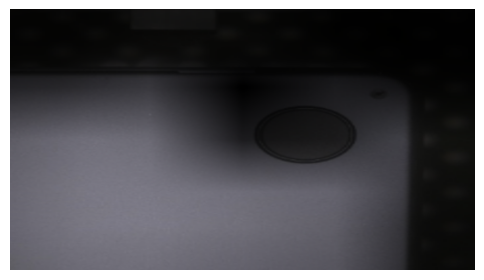

159 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


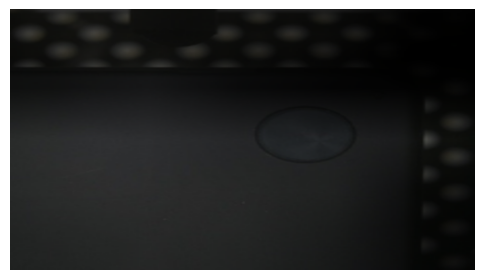

160 The image does not show a yellow sticker, so the score is 0.0. The reason is that there is no visible yellow sticker in the image, making it difficult to assign a higher score.


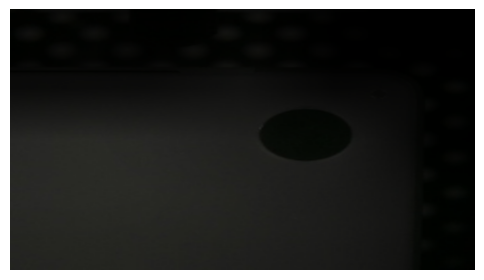

161 The image does not show any yellow sticker, so the score is 0.0. The yellow sticker is not visible in the image, and there is no indication that it is present.


In [ ]:
predicted2 = []
insturuction2 = make_instruction(keyword)

for i, cp in enumerate(progress_bar(video, total=len(video))):
    # key frame selection
    key_path = key_frame_selection(cp, keyword, clip_model, clip_preprocess, device)

    # position context generation
    wa_image = winclip_attention(key_path, text_embedding, clip_model, device, class_adaption, type_id)

    # Anomaly Detection
    generated_text = lvlm_test(tokenizer, lvlm_model, image_processor, insturuction2, None, wa_image)
    score = generate_output(generated_text)['score']

    # visualization
    show_pil_image(wa_image)
    print(i, generated_text)

    # save anomaly score
    for _ in range(clip_length):
        predicted2.append(score)

AUC comparison

In [23]:
gt = np.load(video_label_path)[:len(predicted2)]

NameError: name 'video_label_path' is not defined

In [ ]:
best_auc1 = 0
for sigma in range(1, 100):
    g_predicted1 = gaussian_filter1d(predicted1, sigma=15)
    mm_predicted1 = min_max_normalize(g_predicted1)

    # get auc
    fpr, tpr, _ = metrics.roc_curve(gt, mm_predicted1, pos_label=1)
    auc1 = metrics.auc(fpr, tpr)

    if auc1 > best_auc1:
        best_sigma1 = sigma
        best_auc1 = auc1
        best_predicted1 = mm_predicted1

# show anomaly scores and AUC
anomalies_idx = [i for i,l in enumerate(gt) if l==1]
print('sigma:',best_sigma1, 'auc:',best_auc1)
show_score_graph(anomalies_idx, best_predicted1, best_auc1)

In [ ]:
best_auc2 = 0
for sigma in range(1, 100):
    g_predicted2 = gaussian_filter1d(predicted2, sigma=20)
    mm_predicted2 = min_max_normalize(g_predicted2)

    # get auc
    fpr, tpr, _ = metrics.roc_curve(gt, mm_predicted2, pos_label=1)
    auc2 = metrics.auc(fpr, tpr)

    # show
    if auc2 > best_auc2:
        best_sigma2 = sigma
        best_auc2 = auc2
        best_predicted2 = mm_predicted2

# show anomaly scores and AUC
anomalies_idx = [i for i,l in enumerate(gt) if l==1]
print('sigma:',best_sigma2, 'auc:',best_auc2)
show_score_graph(anomalies_idx, best_predicted2, best_auc2)

In [ ]:
length = len(best_predicted1)
plt.clf()
plt.figure(figsize=(10, 5))
plt.plot([num for num in range(length)],[score for score in best_predicted1], label=f'key frame: AUC={best_auc1:.3f}%', color='black') # plotting
plt.plot([num for num in range(length)],[score for score in best_predicted2], label=f'position context: AUC={best_auc2:.3f}%') # plotting
plt.bar(anomalies_idx, 1, width=1, color='#BBCBE7',alpha=0.5, label='Ground-truth') # check answer
plt.xlabel('Frame', fontsize=12)
plt.ylabel('Anomaly Score', fontsize=12)
plt.legend(fontsize=12, loc='upper left')

x_coord = 320
plt.axvline(x=x_coord, color='gray', linestyle='--', linewidth=1.5)